# **1. Introducción**
La criminalidad en el mundo ha sido un tema a tratar desde el inicio de la sociedad. Los estados y países de todo el mundo se han propuesto bajar los índices de delitos, ya que hoy en día es imposible evitar cualquier clase de delito, pero esto no siempre se puede concretar.

Él data set que tenemos a disposición para el análisis representa las características de algunos de los llamados de emergencia registrados, los cuales son meritorios de llamarse delitos, por ende, fueron atendidos por la policía local.

En el siguiente data set tomaremos como labor principal la inspección de los datos recopilados en este data set, el análisis y la detección de problemáticas relacionadas a estos llamados.

Data set: https://www.kaggle.com/datasets/jgiigii/uscrimesdataset

# **2. Análisis Exploratorio de Datos**
En la siguiente sección veremos de manera básica de que se trata los datos recopilados dentro de este data set, esto con el fin de detectar anomalías y problemas, los cuales podemos solucionar eventualmente.

In [334]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from wordcloud import WordCloud 

na_values = [' ']#?

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory



In [335]:
data = pd.read_csv('https://gitlab.com/c.godoy09/mineria_datos/-/raw/main/Crimes_With_Dates_Cleaned.csv',
                 na_values = na_values)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning:

Columns (2,4,19) have mixed types.Specify dtype option on import or set low_memory=False.



En primera instancia, veremos la totalidad de filas y columnas, a manera de cuantificar la cantidad de datos que tenemos a disposición de análisis.

In [336]:
rows = len(data.axes[0]) 
cols = len(data.axes[1]) 
  
print("Número de filas: " + str(rows)) 
print("Número de columnass: " + str(cols)) 

Número de filas: 306094
Número de columnass: 36


In [337]:
data.head(3)

,Unnamed: 0,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,...,End_Date_Time,Latitude,Longitude,Police District Number,Location,Year,Month,Year-Month,Day,Committed_At_Morning
0,0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,...,NaN,39.177744,-77.265619,5D,"(39.1777, -77.2656)",2018,8,2018-08,23,False
1,1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,...,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",2018,3,2018-03,30,True
2,2,201181293,3562,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,...,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",2018,3,2018-03,30,True


Se puede observar que existe una columna sin datos ni nombre, por ende se eliminará.

In [338]:
data.drop(labels = ["Unnamed: 0"], inplace = True, axis = 1)

Mostramos las primeras 3 filas de nuestra data set, ya con la columna sin nombre eliminada

In [339]:
data.head(3)

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,End_Date_Time,Latitude,Longitude,Police District Number,Location,Year,Month,Year-Month,Day,Committed_At_Morning
0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,NaN,39.177744,-77.265619,5D,"(39.1777, -77.2656)",2018,8,2018-08,23,False
1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",2018,3,2018-03,30,True
2,201181293,3562,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,NaN,38.992693,-77.097063,2D,"(38.9927, -77.0971)",2018,3,2018-03,30,True


Mostramos todas las columnas de nuestro data set y de que tipo corresponde cada variable

In [340]:
# Tipo de dato de cada columna
data.dtypes

Incident ID                 int64
Offence Code               object
CR Number                   int64
Dispatch Date / Time       object
NIBRS Code                 object
Victims                     int64
Crime Name1                object
Crime Name2                object
Crime Name3                object
Police District Name       object
Block Address              object
City                       object
State                      object
Zip Code                  float64
Agency                     object
Place                      object
Sector                     object
Beat                       object
PRA                        object
Address Number            float64
Street Prefix              object
Street Name                object
Street Suffix              object
Street Type                object
Start_Date_Time            object
End_Date_Time              object
Latitude                  float64
Longitude                 float64
Police District Number     object
Location      

### 2.1 Atributos

Las variables presentes en la colección se clasifican como variables cuantitativas y variables cualitativas incluyendo el detalle de cada una de ellas como se muestra a continuación.

**1.- Variables cuantitativas**

- **Victims:** Representa el número de personas afectadas en el delito.
- **Year:** Año del delito
- **Month:** Mes que se realizó del delito
- **Day:** Día que se realizó el delito.

**2.- Variables Cualitativas**

- **Incident.ID:** Número de registro del incidente.
- **CR.Number:** Registro del delito.
- **Zip.Code:** código de la ciudad donde se realizó el delito.
- **Address.Number:** Número de la calle donde se realizó el delito.
- **Latitude:** Coordenada de latitud de la ubicación del delito
- **Longitude:** Coordenada de longitud de la ubicación del delito
- **Offence.Code:** Código representativo del delito.
- **Dispatch Date Time:** Momento en el que se enviaron a los agentes policiales.
- **NIBRS.Code:** Código que representa el tipo de crimen.
- **Crime.Name1:** Tipo De crimen cometido.
- **Crime.Name2:** Categoría del crimen cometido.
- **Crime.Name3:** Información del crimen cometido.
- **Police.District.Name:** Nombre del distrito donde se cometió el delito.
- **Block.Address:** Dirección donde el crimen fue cometido.
- **City:** Ciudad donde ocurrió el crimen.
- **State:** Estado donde se llevó a cabo el crimen.
- **Agency:** Es la agencia a cargo sobre el tipo de delito.
- **Place:** Lugar donde se llevó a cabo el delito (en la calle, una tienda, una casa, etc.)
- **Sector:** Lugar designado para ciertas patrullas
- **Beat:** Policías designados al sector anterior.
- **PRA:** Número de unidad policial.
- **Street.Prefix:** Indicación de la calle si es Norte, Sur, Este u Oeste.
- **Street.Name:** Nombre de la calle.
- **Street.Suffix:** Indicación de la calle si es Norte, Sur, Este u Oeste.
- **Street.Type:** Indicador de si es AVE (Avenida), BLVD (Boulevard),,CT (callejón) , RD (carretera), ST (calle), entre otras.
- **Start_Date_Time:** Tiempo de inicio del proceso.
- **End_Date_Time:** Tiempo de Finalización del proceso.
- **Police.District.Number:** Número del distrito policial.
- **Location:** Ubicación mediante coordenadas.
- **Year.Month:** Año y mes juntos como fecha.
- **Committed_At_Morning:** Si es de mañana o tarde.

Se realiza un "split" en la variable Dispach Date Time (mes día y hora), la cual corresponde a la fecha exacta en la cual se acudió a la emergencia. De esto obtenemos:

- hour: Número de 0 al 24 que representa la hora.
- month: Cadena de texto que índica el mes.
- day_name: Cadena de texto que índica el día

Lo anterior se realiza con el objetivo de poseer variables que ayuden al análisis


In [341]:
data["date"] = pd.to_datetime(data["Dispatch Date / Time"])
data.drop(labels = ["Dispatch Date / Time"], axis = 1, inplace = True)
data["month"] = data["date"].apply(lambda x: x.month_name())
data["day_name"] = data["date"].apply(lambda x: x.day_name())
data["hour"] = data["date"].apply(lambda x: x.hour)

In [342]:
data.head(2)

,Incident ID,Offence Code,CR Number,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,Block Address,...,Location,Year,Month,Year-Month,Day,Committed_At_Morning,date,month,day_name,hour
0,201202980,3550,180042096,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,12800 BLK MIDDLEBROOK RD,...,"(39.1777, -77.2656)",2018,8,2018-08,23,False,2018-08-23 21:52:08,August,Thursday,21.0
1,201181293,3522,180015424,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,8300 BLK WOODMONT AVE,...,"(38.9927, -77.0971)",2018,3,2018-03,30,True,2018-03-30 01:00:55,March,Friday,1.0


## 2.2 Limpieza del data set

Para saber si el dataset cumple es viable es necesario saber si posee `missing values`, óseas celdas que no poseen valor. También debemos saber que atributos no cumplen o no aportan valores a nuestro trabajo.

### 2.2.1 Identificación de NaN

Ahora se listará los atributos junto a la contabilización que presentan de valores nulos o blancos.

In [343]:
data.isnull().sum()

Incident ID                    0
Offence Code                   0
CR Number                      0
NIBRS Code                     0
Victims                        0
Crime Name1                  272
Crime Name2                  272
Crime Name3                  272
Police District Name          94
Block Address              26206
City                        1276
State                          0
Zip Code                    3179
Agency                         0
Place                          0
Sector                      1530
Beat                        1530
PRA                          239
Address Number             26109
Street Prefix             292463
Street Name                    1
Street Suffix             300662
Street Type                  339
Start_Date_Time                0
End_Date_Time             161658
Latitude                       0
Longitude                      0
Police District Number         0
Location                       0
Year                           0
Month     

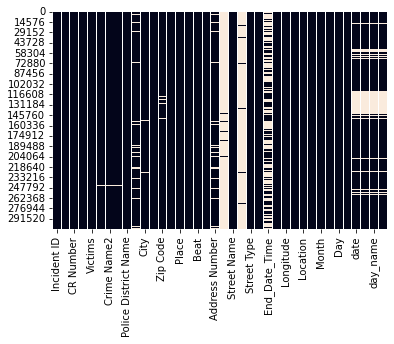

In [344]:
import seaborn as sns

# Identificamos los missing values visualmente
sns.heatmap(data.isnull(), cbar=False)

Se puede observar que variables como `dispach_date_time`, `BlockAdress`, `Street Prefix` y `End_date_time`, por mencionar algunas, presentan gran cantidad datos considerados como N/A o que no han sido registrados, por ejemplo, `Street Suffix` presenta `300662` datos nulos o en blanco de un total de `306094` registros aproximadamente. Producto de lo anterior las nuevas variables generadas (`mont` `day_name` y `year`) poseen `49029` datos nulos

Se eliminarán variables de poca relevancia para nuestro análisis, bajo los siguientes criterios:

- `Street Suffix`,`Street Prefix` y `Street Type`: son datos irrelevantes además de contener bastantes datos nulos o en blanco, por ende se considera que el valor que pueden aportar al análisis es de poco interés.
- `Street name`: la información que aporta también a la la variable `Block Adress` y más completa para efectos de nuestro proyecto
-  `Agency`: es información irrelevante, ya que la información aportada con esta variable es la misma que `Police District Name`, pero de forma más escueta
-`Cr Number`: Representa solo un ID del caso, misma información que obtenemos con `Incident ID`
- `Start_Date_Time`y `End_Date_Time`: representa fechas y horas de inicio del caso y fin, ambas variables son poco relevantes, ya que `Dispach_Date_Time` representa de mejor manera la información que necesitamos para abordar nuestra problemática.
- `Latitude`, `Longitude`, `Place` y `PRA`: la dimension espacial se utiliza mejor mediante la variable `Location`.
- `Year-Month`: para representar el mes y el año, se utiliza `month` y `year`

### 2.2.2 Eliminación de Atributos y NA

Basándose en la sección anterior, se procede a eliminar los atributos que no aportan o se encuentran con número grande de valores NA, y también se precede a eliminar los valores NA.

#### 2.2.2.1 Eliminación de atributos

In [345]:
## Eliminación de atributos
data = data.drop(columns=["Agency","CR Number","Street Name","Street Suffix","Street Prefix","Street Type","Start_Date_Time","NIBRS Code","Latitude","Longitude","End_Date_Time","Place","PRA","Beat","Year-Month","Police District Number"])

#### 2.2.2.2 Eliminación de NA

In [346]:
data.dropna(subset=['Crime Name1', 'Crime Name2', 'Crime Name3','Police District Name','Block Address','City','Address Number','Sector', 'date', 'Month', 'day_name','hour','Zip Code'], inplace=True)

In [347]:
data.isnull().sum()

Incident ID             0
Offence Code            0
Victims                 0
Crime Name1             0
Crime Name2             0
Crime Name3             0
Police District Name    0
Block Address           0
City                    0
State                   0
Zip Code                0
Sector                  0
Address Number          0
Location                0
Year                    0
Month                   0
Day                     0
Committed_At_Morning    0
date                    0
month                   0
day_name                0
hour                    0
dtype: int64

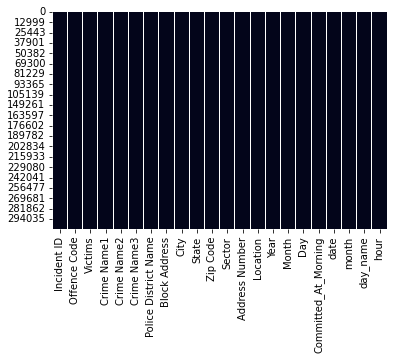

In [348]:
sns.heatmap(data.isnull(), cbar=False)

Realizando una sumatoria de todos los valores NA existentes en el dataset, se puede ver que no existen valores NA. De la misma forma mediante el diagrama es posible ver que no existe presencia de estos valores.

In [349]:
rows = len(data.axes[0]) 
cols = len(data.axes[1]) 
  
print("Número de filas: " + str(rows)) 
print("Número de columnass: " + str(cols)) 

Número de filas: 229289
Número de columnass: 22


Finalmente de poseer `306094` filas y `36` columnas, luego de la limpieza de datos y la agregación de columnas en la **sección 2.1** obtenemos un dataset con `229289` filas y `22` columnas

## 2.3 Exploración y Analisis

Luego de efectuar el análisis exploratorio de los datos, seguimos con la entrega de la información de manera visual, de esta forma lograremos captar de mejor manera la información entregada por el data set.

### 2.3.1 Victimas por ciudad

In [350]:
data.groupby('City')['Victims'].count().sort_values(ascending=False)

City
SILVER SPRING         78228
ROCKVILLE             32927
GAITHERSBURG          32445
GERMANTOWN            22854
BETHESDA              16827
MONTGOMERY VILLAGE     7083
TAKOMA PARK            5437
POTOMAC                5085
CHEVY CHASE            4979
DERWOOD                4271
KENSINGTON             3692
OLNEY                  3585
BURTONSVILLE           2806
CLARKSBURG             2604
DAMASCUS               1933
BOYDS                  1607
BROOKEVILLE             730
POOLESVILLE             701
SANDY SPRING            327
ASHTON                  278
DICKERSON               240
CABIN JOHN              176
SPENCERVILLE            111
GLEN ECHO                71
BRINKLOW                 58
MOUNT AIRY               48
BEALLSVILLE              37
LAUREL                   36
BARNESVILLE              30
MT AIRY                  17
GARRETT PARK             15
BELTSVILLE               12
HIGHLAND                  9
WASHINGTON GROVE          6
WASHINGTON                6
WOODBINE       

Tenemos en el dataset registro de delitos de 54 ciudades, de las cuales luego de la limpieza de datos se utilizan 43 ciudades, en donde:

- 16 ciudades registran más de 1000 delitos
- 7 ciudades entre 100 a 1000 delitos. 
- 9 ciudades entre 10 y 100 delitos.
- 11 ciudades con menos de 10 delitos.

### 2.3.2 Delitos por mes y año

In [371]:
#Delitos por año y mes
import plotly.express as px
month_order = ["January", "February", "March", "April", "May", 
    "June", "July", "August", "September",
    "October", "November", "December"]
year_order = np.sort(data.Year.unique())
fig = px.histogram(
    data, x = "month", barmode = "group",
    color = "Year",
    category_orders = {"Year": year_order, "month": month_order}
)
fig.show()

A partir del año `2017` existe una disminución de los delitos cometidos, sin embargo, el año `2017` y `2022` poseen una diferencia considerable con los demás años.
Los delitos cometidos durante el año `2016` son registrados desde el mes de julio hasta el mes de diciembre, mientras que el año `2022` los delitos son registrados desde el mes de enero hasta una parte del mes de agosto. Debido a lo anterior estos años poseen una diferencia en sus registros respecto a los otros años.

### 2.3.3 Delitos por días

In [370]:
px.defaults.template = "seaborn"
days_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
year_order = np.sort(data.Year.unique())
fig = px.histogram(
    data, x = "day_name", 
    category_orders = {"day_name": days_order, "Year": year_order},
    color = "Committed_At_Morning", barmode = "group",
)
fig.show()

En este gráfico se puede observar que el día martes es el día en el cual se reciben más alertas de delitos durante una semana, también es apreciable que los días domingos son los días con menos alertas de delitos registrados en esta muestra, también podemos observar que los delitos son alertados mayormente en el horario de la tarde, con más del doble de alertas, en comparación del horario de la mañana

### 2.3.4 Delitos por hora

Ahora se observará de manera más detallada el anterior gráfico, al visualizar la proporción de las alertas por horas y no por jornadas.

In [372]:
days_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
d = data
d["hour"] = d["hour"].astype(int).astype(str)
fig = px.histogram(
    d, x = "hour", barmode = "group",
    category_orders = {
        "Year": year_order,
        "hour": sorted(range(24))                  
                      },
)
fig.add_annotation(
    x = 4, y = 4500,
    arrowcolor = "black", arrowwidth = 2,
    text = "Tendencia baja de crimenes", 
)
fig.show()

La actividad delictual expresada en las horas del día, se puede observar una mayor actividad en el rango de las 15 a 16 horas, y la menor actividad se detecta en el rango horario de las 4 a 5 de la madrugada.

El gráfico visualiza de manera eficaz el porcentaje que representa cada uno de los tipos de delitos dentro de la muestra. El mayor porcentaje con un 50.2% de los delitos registrados es en contra de la propiedad, le sigue con un 22.2% de delitos varios, con un 15.7% se acontecen alertas por crímenes contra la sociedad, el 10.7% de las alertas corresponden a crímenes contra la persona y por último, el 1.31% son alertas que no corresponden a ningún crimen en concreto.

### 2.3.5 Proporcion del Tipo de Crimen

In [373]:
fig = px.pie(
    data.dropna(subset = ["Crime Name1"]), names = "Crime Name1",
    labels={"Crime Name1": "Crime type:"}, 
    title = "Type of crime",
)
fig.update_layout(
    title = dict(
        font_size = 30,
        
    ),
    legend = dict(
        bgcolor="LightSteelBlue",
        font_size = 15
    
    ),
)
fig.show()

### 2.3.6 Cantidad de crimenes a lo largo de los años por categoria

Teniendo la información de las cantidades y comportamientos del registro de alertas delictivas durante horas y días, nos compete definir a que corresponden estas alertas

En este gráfico observamos la cantidad de llamados de emergencia a lo largo de los años, los cuales fueron categorizados dependiendo del tipo de crimen cometido.

In [355]:
data_groupby_year = data.groupby(['Year', 'Crime Name1']).size().unstack().reset_index(inplace=False)

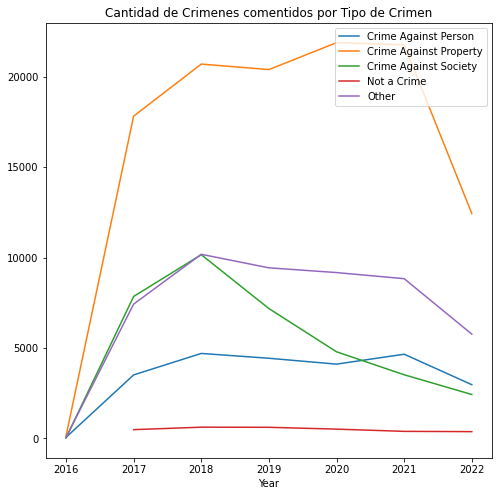

<Figure size 432x288 with 0 Axes>

In [356]:
crimes = ['Crime Against Person', 'Crime Against Property', 'Crime Against Society', 'Not a Crime', 'Other']
data_groupby_year.plot(x='Year', y=crimes, kind="line", figsize=(8, 8))
plt.legend(loc='upper right')
plt.title('Cantidad de Crimenes comentidos por Tipo de Crimen')
plt.show()
plt.clf()

Se observa que la tendencia de las alertas corresponden a los crímenes que atentan contra la propiedad, también se aprecia un declive en las alertas en el último año, esto se puede explicar, ya que el año 2022 aún no termina, por ende los registros se encuentran incompletos

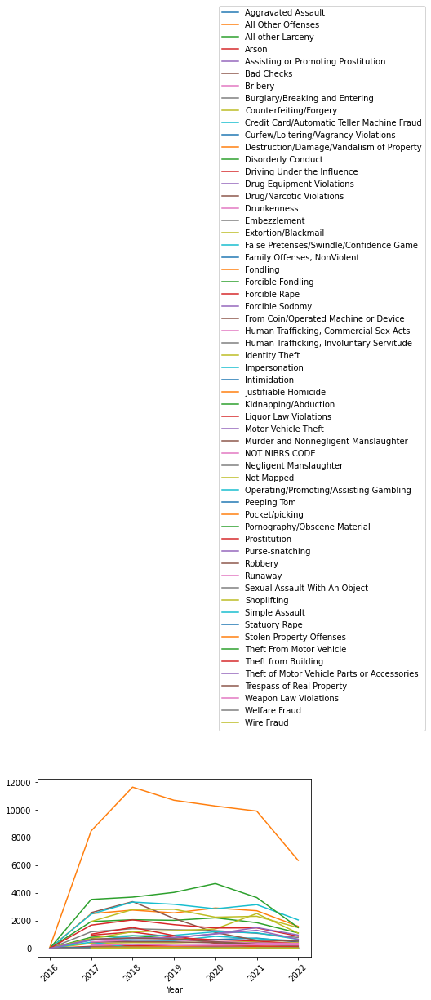

In [357]:
data_group_by_year_crime_2 = data.groupby(['Year', 'Crime Name2'])['Crime Name2'].count()
 
# plot the result
data_group_by_year_crime_2.unstack().plot()
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor = (0.65, 1.25))
plt.show()

Destacamos que existen un tipo de crimen que destaca por sobre el resto el cual tuvo su frecuencia de más alta en el año 2018 y luego empieza una caída sustancial en esa cantidad de crimenes.

Se pretende ahora definir con mayor detalle la proporción que tiene cada tipo de alerta delictiva dentro del registro de datos

## 2.4 Preguntas y Problematicas detectadas

Dada la información obtenida mediante los análisis previos hemos encontrado la siguiente problemática, hemos visto que existen diferencias de la cantidad de delitos cometidos entre día y noche, entre los meses e incluso entre los años, pero nos gustaría saber cómo podemos predecir estos crímenes. Para esto debemos tener en cuenta 2 preguntas:
- ¿Qué delito deberíamos prestar atención en cierta fecha?
- ¿Cuáles son los tipos de crímenes que debemos prestar atención durante cierto periodo de tiempo?
- ¿Si tenemos una alerta en cierta hora y cierto día, que tipo de alerta de crimen será?

# 3. **Modelo Propuesto**
Luego del análisis efectuado podemos definir y plantear que nuestro experimento será propuesto como un problema de clasificación, tomando el atributo `Crime Name1` de nuestro dataset, el cual índica el Tipo de crimen. De este modo intentaremos establecer cuál modelo nos permitirá obtener mejores resultados al momento de clasificar un tipo de crimen. Para esta propuesta se utilizaron los siguientes algoritmos;
1. Árbol de Decisión
2. KNN: Ya que al ser un modelo "supervisado" nos permitirá obtener la variable que deseamos  predecir a partir de otras variables.

De igual forma las variables utilizadas para esta propuesta e implementadas en los modelos serán
1. Year
2. Month
3. Day
4. hour
5. Victims
6. Committed_At_Morning


## 3.1 Árbol de Decisión

Se define la variable `target` y las columnas usadas para la predicción.
 
El siguiente caso nuestro target serán los `Crime Name1` ya que buscamos predecir esta columna en este método experimental.
 
Mientras que las variables utilizadas para predecir la columna `Crime Name1` son las mencionadas en el Modelo Propuesto.



In [358]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
import numpy as np

TargetVariable='Crime Name1'
Predictors=['Victims', 'Year', 'Month', 'hour', 'Day', 'Committed_At_Morning']
X=data[Predictors].values
y=data[TargetVariable].values

Se define el set de prueba y el de entrenamiento con un 33% de los datos como datos para realizar el testeo de la predicción y que siempre ocupe el mismo *random* para la evaluación del resultado el cual es la semilla 37.

In [359]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.33, random_state=37)

Ahora se definen los criterios de `entropy` para el árbol de decisiones y como profundidad máxima del árbol 3 para evitar el sobreajuste del mismo.

In [360]:
#Se define los hiperparametros
clf = DecisionTreeClassifier(max_depth=3,criterion='entropy')
 
#Printing all the parameters of Decision Trees
print(clf)

#Se crea el modelo de entrenamiento
DTree=clf.fit(X_train,y_train)
prediction=DTree.predict(X_test)

DecisionTreeClassifier(criterion='entropy', max_depth=3)


In [361]:
print(classification_report(y_test, prediction))
print(confusion_matrix(y_test, prediction))

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



                        precision    recall  f1-score   support

  Crime Against Person       0.91      0.17      0.29      8019
Crime Against Property       0.53      0.98      0.68     37942
 Crime Against Society       0.43      0.13      0.20     11939
           Not a Crime       0.00      0.00      0.00       964
                 Other       0.00      0.00      0.00     16802

              accuracy                           0.53     75666
             macro avg       0.37      0.26      0.23     75666
          weighted avg       0.43      0.53      0.41     75666

[[ 1393  6153   473     0     0]
 [    0 37086   856     0     0]
 [    0 10392  1547     0     0]
 [    0   895    69     0     0]
 [  135 15975   692     0     0]]


Se observa una precisión bastante alta en Crime Against Person, pero no se puede tener certeza de que estos valores nos permitan realmente predecir correctamente todo los crimenes ya que existen 2 categorías en un 0% de predicción por los datos.


En el caso de la matriz de confusión observamos que el que tiene más aciertos es Crime

### 3.1.1 Evaluación de desempeño del modelo
Para medir el desempeño del modelo utilizaremos `cross validation`, en este primer caso con la combinación de splits de 10

In [362]:
from sklearn.model_selection import KFold, cross_val_score

k_folds = KFold(n_splits = 10)

scores = cross_val_score(clf, X, y, cv = k_folds)
print(scores)

[0.5811854  0.50734877 0.00300929 0.13441493 0.64233067 0.63099132
 0.62977016 0.65467312 0.71424833 0.77224355]


Como resultado obtenemos una lista que refleja los valores por cada validación de los datos de prueba, donde los valores rondan entre %0 y como máximo %77.2

Ahora en este segundo caso con la combinacion de splits de 15

In [363]:
k_folds = KFold(n_splits = 15)

scores = cross_val_score(clf, X, y, cv = k_folds)
print(scores)

[0.60035326 0.5317938  0.50065419 0.00418684 0.00157006 0.20031401
 0.65792228 0.6461468  0.6261939  0.63168913 0.61618474 0.67296873
 0.68997776 0.76664922 0.77311089]


Como resultado obtenemos una lista que refleja los valores por cada validación de los datos de prueba, donde los valores rondan entre %0 y como máximo %77.3

## 3.2 KNN
Creamos nuestro X e y de entrada y los sets de entrenamiento y test a partir de los atributos que utilicemos.

In [364]:
# knn
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier

X = data[['Victims', 'Year', 'Month', 'hour', 'Day', 'Committed_At_Morning']].values
y = data['Crime Name1'].values

Entrenamiento del dataset a partir del target y la data

In [365]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=40)

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

Creacion del clasificador knn, a partir de

In [366]:
knn = KNeighborsClassifier(10)
knn.fit(X_train, y_train)
print('Accuracy of K-NN classifier on training set: {:.2f}'
     .format(knn.score(X_train, y_train)))
print('Accuracy of K-NN classifier on test set: {:.2f}'
     .format(knn.score(X_test, y_test)))

Accuracy of K-NN classifier on training set: 0.57
Accuracy of K-NN classifier on test set: 0.50


In [367]:
pred = knn.predict(X_test)
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

[[  635  3953   814     1   675]
 [  659 23782  1838     2  2427]
 [  366  5231  2569     1   864]
 [   29   506   113     0    97]
 [  443  9463  1290     2  1563]]
                        precision    recall  f1-score   support

  Crime Against Person       0.30      0.10      0.15      6078
Crime Against Property       0.55      0.83      0.66     28708
 Crime Against Society       0.39      0.28      0.33      9031
           Not a Crime       0.00      0.00      0.00       745
                 Other       0.28      0.12      0.17     12761

              accuracy                           0.50     57323
             macro avg       0.30      0.27      0.26     57323
          weighted avg       0.43      0.50      0.44     57323



### 3.2.1 Evaluacion de desempeño del modelo
Para medir el desempeño del modelos utilizaremos cross validation, ya que nos permitira testear el modelo a partir de la cantidad de segmetaciones que utilicemos

In [368]:
from sklearn.model_selection import KFold, cross_val_score

k_folds = KFold(n_splits = 10)

scores = cross_val_score(knn, X, y, cv = k_folds)
print(scores)

[0.46622182 0.45065201 0.04976231 0.17506215 0.16690654 0.18278163
 0.17937982 0.16695015 0.22622007 0.30992673]



Como resultado obtenemos una lista que refleja los valores por cada validación de los datos de prueba, donde los valores como minimo son de 5% y como máximo un 46%


## 3.3 Resultados
Si bien se logró compara los resultados de la clasificación entre `Árbol de decisiones` y `KNN` se observa un mejor resultado en el método de `Árbol de decisiones`, pero no son concluyentes a responder las problemáticas ya que sus valores no son muy representativos en cuanto a todos los resultados posibles en el problema. Ademas podemos concluir que nuestro dataset no posee datos equilibrados en cuanto al atributo que queremos predecir y tambien en posible que se necesite aplicar otras tecnicas mas avanzadas para obtener resultados mas alentadores.



# 4. Trabajo realizado
- **Diego Garrido:** Redacción, estructuración del proyecto, creación de introducción, limpieza y justificación de variables, gráfico de tarta y análisis, gráfico de horas y análisis y gráfico de jornadas y análisis

- **Nicolas Pereira:** Redacción, creacion de grafico de tipos de Crimenes, analisis, desarollo de la propuesta y creacion de los metodos de clasificación.

- **Ricardo:** Código y redacción de la sección 2.2, código y análisis de la sección 2.3.2 y 2.3.2. Orden de secciones. Redacción de Resumen en PDF (Slide 0 a 8).

- **Camilo Godoy:** Desarrollo de propuesta experimental ,Creación de métodos de clasificación, Redacción de preguntas y propuesta experimental.
